# Paddock time series cluster plots

Starting with an array of paddock x variable x time (pvt) and a geo dataframe of polygons

## Setup

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import seaborn as sns
import xarray as xr
import matplotlib.pyplot as plt 
import matplotlib

%matplotlib inline

import skimage
from dea_tools.plotting import display_map, rgb, xr_animation
from dea_tools.bandindices import calculate_indices
import cv2 
from matplotlib.gridspec import GridSpec
from dea_tools.plotting import display_map, rgb, xr_animation
import skimage

from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import KShape, KernelKMeans, silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans

from IPython.display import Image
from IPython.core.display import Video

In [32]:
# unique identifier for the run 
stub = 'fm_ndwi_4'
#stub = 'ADAMO'
#stub = 'GRANT'

# location of the cached data sets
data_path = '/home/jovyan/Projects/PaddockTS/Data/Paddocks/'

# Results directory
results_path = '/home/jovyan/Projects/PaddockTS/Results/'

In [3]:
# Read in the polygons
pol = gpd.read_file(data_path+stub+'_filt.gpkg')

# have to set a paddock id. Preferably do this in earlier step in future... 
pol['paddock'] = range(1,len(pol)+1)
pol['paddock'] = pol.paddock.astype('category')


# Read in the array of paddocks by variables (e.g. bands) by time -- the pvt array
pvt = np.load(data_path+stub+'_pvt.npy')


# Read in the time stack of multiband sentinel data including index bands. 
ds = xr.open_dataset(data_path+stub+'_ds.nc')

In [4]:
# Calculate the chosen vegetation proxy index and add it to the loaded data set
ds = calculate_indices(ds, index=['NDVI','NDWI'], collection='ga_s2_3')

# Resample data weekly
ds_weekly = ds.resample(time="1W").interpolate("linear")


In [5]:
# Function to check missing data in a pandas df found here: https://www.kaggle.com/code/parulpandey/a-guide-to-handling-missing-values-in-python

# credit: https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction. 
# One of the best notebooks on getting started with a ML problem.

def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [6]:
# Temporary directory for animations, frames and plots

# clear the tmp directory and create anew
import os
import shutil
tmp_dir = "/home/jovyan/Projects/PaddockTS/tmp/"
shutil.rmtree(tmp_dir)
os.makedirs(tmp_dir)

## Check the data before starting Time Series Analysis

number of missing pixels across all ndvi ts : 59


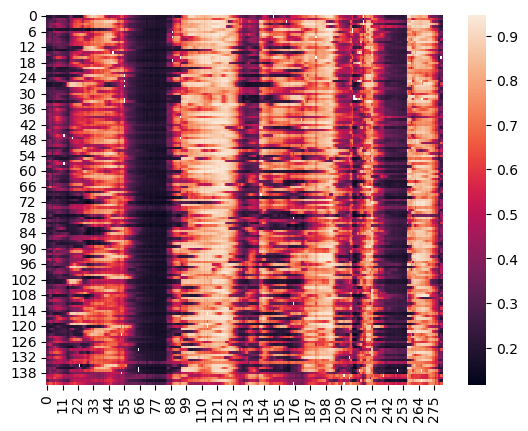

In [33]:
# get array into paddock-time-variable (ptv)

ptv = np.rollaxis(pvt, axis = 1, start = 3)

# check ndvi time series for all paddocks
pt_ndvi = ptv[:,:,4]
sns.heatmap(pt_ndvi)

print('number of missing pixels across all ndvi ts :', np.count_nonzero(np.isnan(pt_ndvi)))

# save this plot to results
plt.savefig(results_path+stub+"_sns_heatmap.png")


## Time Series Analysis

In [14]:
# following tslearn and the sklearn kits, get the data into a pandas dataframe with column for datetime and a column for each paddock:

pads = list(pol.paddock)
df = pd.DataFrame(pt_ndvi.T,
                 columns = pads)

# check missing data:
#print(missing_values_table(df))

df = df.interpolate(method = 'linear', axis = 'columns')
df

df.insert(loc=0, column='datetime', value = ds.time.values)
df.shape

(282, 144)

In [15]:
### Resample the pandas df to weekly time series and select a single year. 

def get_weekly(df, interval, start, stop, interpolate = True):
    
    '''resample the time series to an equal window (take median) for nice annual periodicity, 
    truncate to a specific time interval for potentially easier clustering,
    interpolate over missing time windows
    
    Input: a pandas df with first column datetime and columns for each paddock
    Returns: a new pandas df '''
    
    import datetime 
    datetime.datetime.strptime

    # interval = '7D'
    # start = '2020-01-01'
    # stop = '2021-01-01'
    # interpolate = True

    df_resamp = df[(df['datetime'] > start) & (df['datetime'] < stop)]

    df_resamp = df_resamp.set_index('datetime').resample(interval).median()
    
    before = df_resamp.mean(axis=1).to_frame()

    if interpolate == True:
        df_resamp = df_resamp.interpolate(method = 'linear', axis = 'rows') # Careful. sometimes we're going 3+ weeks without data....
    
    df_resamp['datetime'] = df_resamp.index
    
    after = df_resamp.mean(axis=1).to_frame()    
    
    ba = pd.DataFrame(columns = ['before', 'after'])
    ba['before'] = before
    ba['after'] = after
    ba['datetime'] = ba.index
    
    ax1 = ba.plot(kind='scatter', x='datetime', y='after', color='r')    
    ax2 = ba.plot(kind='scatter', x='datetime', y='before', color='b', ax=ax1)    

    print(ax1 == ax2)  # True
    
    return(df_resamp)

### In future, generate time series plot of the mean NDVI before and after interpolation to show extent and effect of missing data. 


True
Your selected dataframe has 103 columns.
There are 0 columns that have missing values.


/tmp/ipykernel_1634/430739002.py:31: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  after = df_resamp.mean(axis=1).to_frame()
/tmp/ipykernel_1634/4041102264.py:10: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df.mean(axis=1)


,Missing Values,% of Total Values
datetime,,


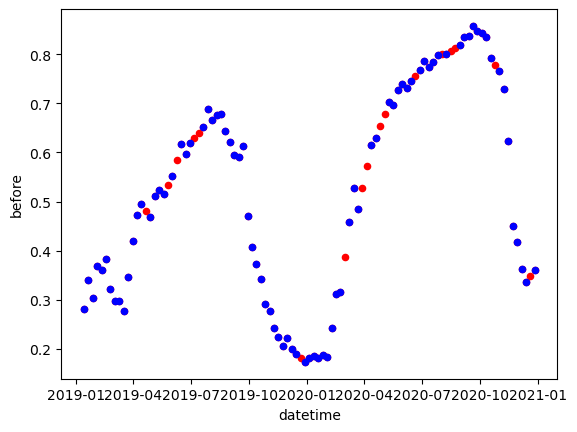

In [16]:
#df_ = get_weekly(df, '7D', '2019-01-01', '2024-01-01', interpolate = True)
#df_ = get_weekly(df, '7D', '2019-01-01', '2021-01-01', interpolate = True)

# Use one year for testing
df_ = get_weekly(df, '7D', '2019-01-01', '2021-01-01', interpolate = True)


df_ = df_.dropna(axis = 0)
df_.shape
df.mean(axis=1)

# Create X_train

X = df_.T.drop('datetime')
X_train = TimeSeriesScalerMeanVariance().fit_transform(X) # transform or not?

missing_values_table(X) # X can't have ANY missing values..


## Calculate clusters

<Figure size 640x480 with 0 Axes>

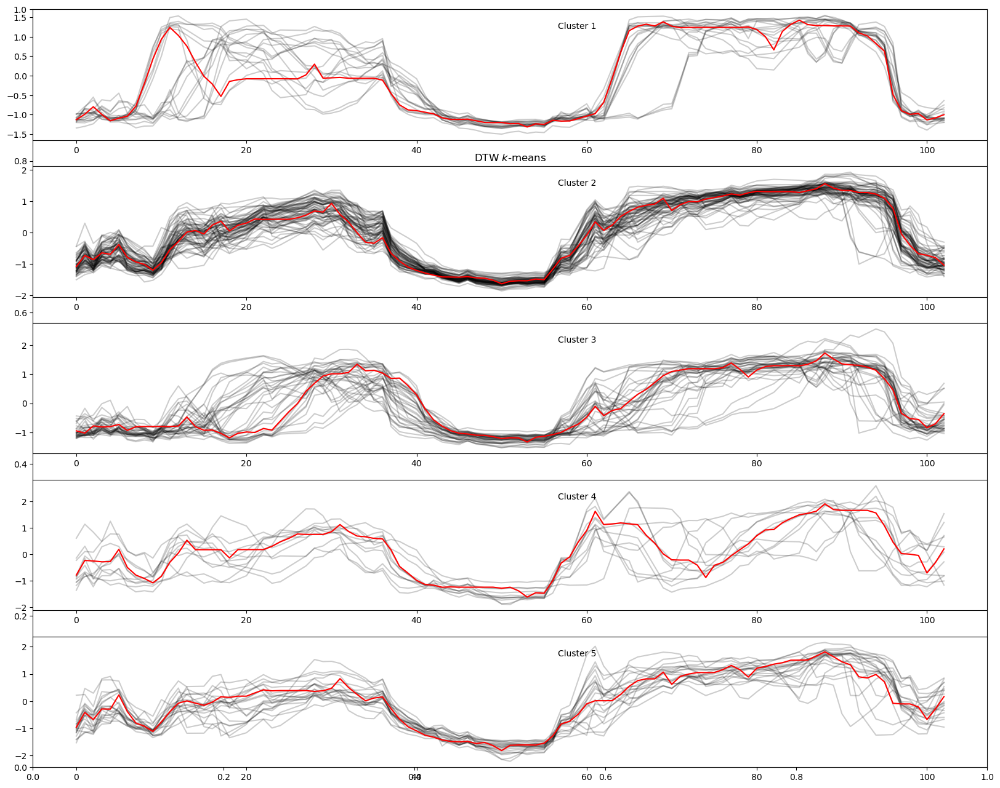

In [17]:
### PLOT clusters for specified k-value
N_CLUSTERS = 5

# Euclidean k-means
km = TimeSeriesKMeans(n_clusters=N_CLUSTERS, verbose=False, random_state=42,n_jobs=-1, metric = 'dtw')
y_pred = km.fit_predict(X_train)
plt.figure()
plt.subplots(figsize = (20, 16))
for yi in range(N_CLUSTERS):
    plt.subplot(N_CLUSTERS,1 , yi + 1) # Sets the plot panel layout (make sure the n_rows and n_cols multiply to get approx N_CLUSTERS)
    for xx in X_train[y_pred == yi]: # takes the NDVI time series (from X_train) for rows corresponding to a specified cluster
        plt.plot(xx.ravel(), "k-", alpha=.2) # plots the trace for each paddock with some transparancy (alpha<1)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-") # plots trace of the "average" paddock in the cluster
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DTW $k$-means")

In [18]:
# check out spatial clustering patterns:
pol['y_pred'] = y_pred
pol['y_pred'] = pol['y_pred'].astype('category')
pol.explore(column='y_pred')

## Create RGB and NDVI animations

In [19]:
# Set colors for polygon edges (unique per cluster)
colors = {0:'#1f77b4',1:'#ff7f0e', 2:'#2ca02c', 3:'#d62728', 4:'#9467bd', 5:'#8c564b', 6:'#e377c2', 7:'#7f7f7f', 8:'#bcbd22', 9:'#17becf'}

pol['color_edge'] = pol['y_pred'].map(colors)
pol['color_edge']

0      #1f77b4
1      #ff7f0e
2      #2ca02c
3      #ff7f0e
4      #ff7f0e
        ...   
138    #9467bd
139    #d62728
140    #9467bd
141    #9467bd
142    #d62728
Name: color_edge, Length: 143, dtype: category
Categories (5, object): ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

{0: '#1f77b4', 1: '#ff7f0e', 2: '#2ca02c', 3: '#d62728', 4: '#9467bd', 5: '#8c564b', 6: '#e377c2', 7: '#7f7f7f', 8: '#bcbd22', 9: '#17becf'}
Exporting animation to /home/jovyan/Projects/PaddockTS/Results/fm_ndwi_4_ndvi.mp4


  0%|          | 0/259 (0.0 seconds remaining at ? frames/s)

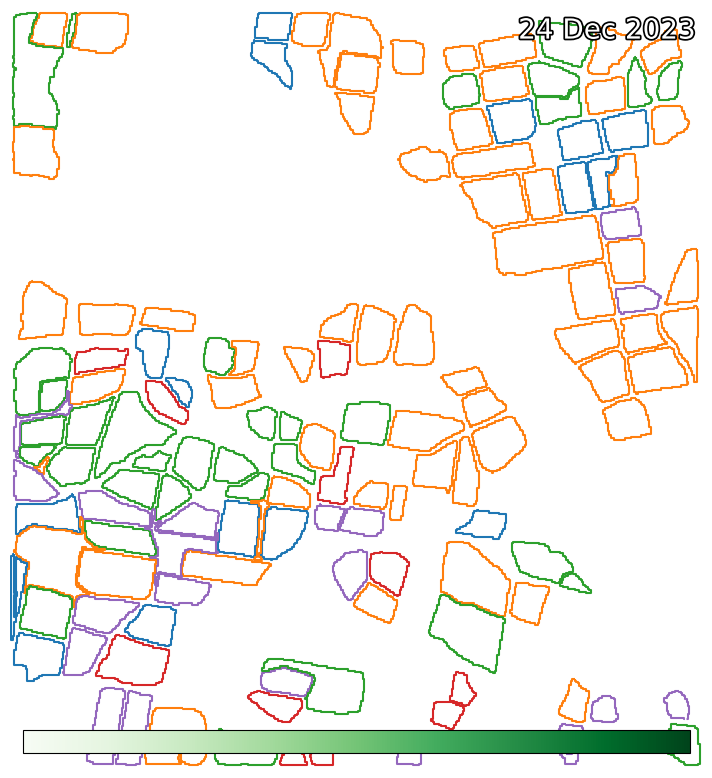

In [34]:
# Create NDVI animation 
animation_out = results_path+stub+'_ndvi.mp4'

# Set color for polygon fill (fully transparent)
pol["color"] = 'None' 

# Set colors for polygon edges (unique per cluster)
colors = {0:'#1f77b4',1:'#ff7f0e', 2:'#2ca02c', 3:'#d62728', 4:'#9467bd', 5:'#8c564b', 6:'#e377c2', 7:'#7f7f7f', 8:'#bcbd22', 9:'#17becf'}
colors
print(colors)

pol['color_edge'] = pol['y_pred'].map(colors)

xr_animation(ds_weekly, 
             bands=["NDVI"], 
             output_path = animation_out, 
             show_gdf = pol, 
             gdf_kwargs={"edgecolor": pol['color_edge']},
             imshow_kwargs={"cmap": "Greens", "vmin": 0.0, "vmax": 1.0},
            )


Exporting animation to /home/jovyan/Projects/PaddockTS/tmp/fm_ndwi_4_rgb.mp4


  0%|          | 0/259 (0.0 seconds remaining at ? frames/s)

/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/env/lib/pyth

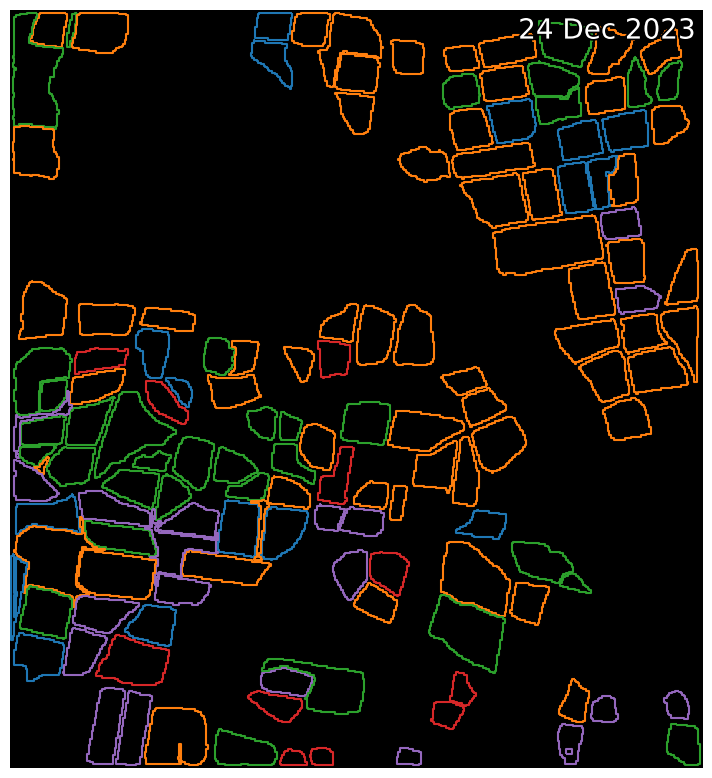

In [22]:
# Create RGB animation 
animation_out = results_path+stub+'_rgb.mp4'

# Set color for polygon fill (fully transparent)
pol["color"] = 'None' 

pol['color_edge'] = pol['y_pred'].map(colors)

xr_animation(ds_weekly, 
             bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = animation_out, 
             show_gdf = pol, 
             gdf_kwargs={"edgecolor": pol['color_edge']}
            )

In [35]:
# View NDVI animation
Video(results_path+stub+'_ndvi.mp4', embed = True)

In [23]:
# View RGB animation
Video(results_path+stub+'_rgb.mp4', embed = True)

## Extract Frames

In [24]:
# Function to extract frames 
def FrameCapture_rgb(video, outdir): 
  
    # Path to video file 
    vidObj = cv2.VideoCapture(video) 
  
    # Used as counter variable 
    count = 0
  
    # checks whether frames were extracted 
    success = 1
  
    while success: 
  
        # vidObj object calls read 
        # function extract frames 
        success, image = vidObj.read() 
  
        # Saves the frames with frame-count 
        cv2.imwrite(outdir+"rgb_frame%d.jpg" % count, image) 
  
        count += 1
    
def FrameCapture_ndvi(video, outdir): 
  
    # Path to video file 
    vidObj = cv2.VideoCapture(video) 
  
    # Used as counter variable 
    count = 0
  
    # checks whether frames were extracted 
    success = 1
  
    while success: 
  
        # vidObj object calls read 
        # function extract frames 
        success, image = vidObj.read() 
  
        # Saves the frames with frame-count 
        cv2.imwrite(outdir+"ndvi_frame%d.jpg" % count, image) 
  
        count += 1


In [25]:
# Calling the function for RGB animation
animation_out_rgb = results_path+stub+'_rgb.mp4'
FrameCapture_rgb(animation_out_rgb, tmp_dir) # seems to give an error on the last loop, even when it works.. Need to suppress this error message.

error: OpenCV(4.9.0) /io/opencv/modules/imgcodecs/src/loadsave.cpp:786: error: (-215:Assertion failed) !_img.empty() in function 'imwrite'


In [36]:
# Calling the function for NDVI animation
animation_out_ndvi = results_path+stub+'_ndvi.mp4'
FrameCapture_ndvi(animation_out_ndvi, tmp_dir)

error: OpenCV(4.9.0) /io/opencv/modules/imgcodecs/src/loadsave.cpp:786: error: (-215:Assertion failed) !_img.empty() in function 'imwrite'


## Create plots with RGB image, NDVI image, and NDVI time series for all clusters

In [27]:
# convert datetime to pandas series
series = pd.Series(ds_weekly.time.values)  

n_frame = X_train.shape[1] # the total number of frames. Setting this way means it automatically updates if we change the input file.
#n_frame = 5 # for testing purposes, use just 5 frames
print("No. frames to plot:", n_frame)

for n in range(n_frame):
    fig = plt.figure(figsize = (12,6))
    gs = GridSpec(N_CLUSTERS*2,4)
    axes = {}
    ax = 'ax'

    # create first two axes
    # RGB image 
    ax1 = fig.add_subplot(gs[:N_CLUSTERS,1:2])
    img_rgb = plt.imread(tmp_dir+"rgb_frame%d.jpg" % n)
    ax1.imshow(img_rgb)
    ax1.axis('off')
    # NDVI image
    ax2 = fig.add_subplot(gs[N_CLUSTERS:,1:2])
    img_ndvi = plt.imread(tmp_dir+"ndvi_frame%d.jpg" % n)
    ax2.imshow(img_ndvi)
    ax2.axis('off')
    
    # Plot all the cluster NDVI graphs
    for k in range(N_CLUSTERS):
        height_min = 2*k
        height_max = 2*k + 2
        
        # Create axis 'ax+k'
        locals()[ax+str(k)] = fig.add_subplot(gs[height_min:height_max,2:])
        axes[k] = locals()[ax+str(k)]
        
        # Plot line for current timestep
        axes[k].plot([n,n],[-3,2])
        
        yi=k
        color_k = colors[list(colors)[yi]] # get the color that goes with this cluster
        for xx in X_train[y_pred == yi]:
            axes[k].plot(xx.ravel(), "k-", alpha=.2)
            axes[k].plot(km.cluster_centers_[yi].ravel(), color_k)
            axes[k].set_xticks([])
            # axes[k].text(0.55, 0.85,'Cluster %d' % (yi), # Not sure why this text doesn't show...
            #     transform=plt.gca().transAxes)
    
    # Label time on x-axis
    t1 = 0
    t2 = round(X_train.shape[1]/4)
    t3 = round(X_train.shape[1]/2)
    t4 = round(3*X_train.shape[1]/4)
    t5 = X_train.shape[1]
    labels = [series[t1].strftime("%m/%Y"), series[t2].strftime("%m/%Y"), 
              series[t3].strftime("%m/%Y"), series[t4].strftime("%m/%Y"),
              series[t5].strftime("%m/%Y")]
    axes[k].set_xticks([t1, t2, t3, t4, t5], labels, rotation = 45)
    
    # Save plot
    plt.savefig(tmp_dir+"multi_frame%d.jpg" % n)
    plt.clf()

No. frames to plot: 103


/tmp/ipykernel_1634/4129256368.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (12,6))


<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

## Convert plots back to animation

In [28]:
# Changed this block so we can pass python variables into the command line:
# Also, have to remove the outfile, otherwise get asked whether to overwrite...

infiles = tmp_dir+"multi_frame%d.jpg"
outfile = results_path+stub+"_multiplot_.mp4"

print(infiles, outfile)

! rm {outfile}
! ffmpeg -framerate 4 -i {infiles} -c:v libx264 -r 30 {outfile}

# EXAMPLE:
# # pass variable into shell command
# message = "hello from Python"
# !echo {message}


/home/jovyan/Projects/PaddockTS/tmp/multi_frame%d.jpg /home/jovyan/Projects/PaddockTS/Results/fm_ndwi_4multiplot_.mp4
ffmpeg version 6.1 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 12.3.0 (conda-forge gcc 12.3.0-3)
  configuration: --prefix=/env --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1699837816504/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1699837816504/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1699837816504/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1699837816504/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-libdav1d --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-libass --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264

In [29]:
# View final video
Video(outfile, embed = True)